In [1]:
import cv2
import numpy as np
from shapely.geometry import Point
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely import wkt

In [2]:
# Load the GeoJSON
gdf_combined = gpd.read_file('data/Street_view/Preprocessed_to_use_for_picture_extraction.geojson')

# Recreate geometry_midpoint from midpoint_x and midpoint_y
gdf_combined['geometry_midpoint'] = gdf_combined.apply(lambda row: Point(row['midpoint_x'], row['midpoint_y']), axis=1)

# Convert the geometry_outer_edge from string to LineString
gdf_combined['geometry_outer_edge'] = gdf_combined['geometry_outer_edge'].apply(wkt.loads)


In [3]:
def convert_bgr_to_rgb(image):
    # Converts the image from OpenCV's BGR format to RGB for correct color representation
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

def calculate_dynamic_fov(v1, v2):
    """
    Calculate the dynamic Field of View based on the vectors v1 and v2.
    
    Parameters:
    v1, v2: numpy arrays representing the vectors
    
    Returns:
    fov: The calculated Field of View in degrees, capped at 120°
    """
    # Ensure v1 and v2 are numpy arrays
    v1 = np.array(v1)
    v2 = np.array(v2)
    
    # Calculate the dot product of v1 and v2
    dot_product = np.dot(v1, v2)
    
    # Calculate the magnitudes of v1 and v2
    magnitude_product = np.linalg.norm(v1) * np.linalg.norm(v2)
    
    # Calculate the FoV using the arccos function
    fov_radians = np.arccos(dot_product / magnitude_product)
    
    # Convert to degrees
    fov_degrees = np.degrees(fov_radians)
    
    # Cap the FoV at 120°
    fov = min(fov_degrees, 120)
    
    return fov

def calculate_vectors(camera_coords, target_coords):
    """
    Calculate the vectors v1 and v2 based on camera and target coordinates.
    
    Parameters:
    camera_coords: (x, y, z) coordinates of the camera
    target_coords: (x, y, z) coordinates of the target
    
    Returns:
    v1, v2: numpy arrays representing the vectors
    """
    camera = np.array(camera_coords)
    target = np.array(target_coords)
    
    # Calculate v2 (vector from camera to target)
    v2 = target - camera
    
    # Assume v1 is the forward-facing vector of the camera
    # For simplicity, let's assume it's pointing along the x-axis
    v1 = np.array([1, 0, 0])
    
    return v1, v2

def adjust_fov_based_on_distance(camera_coords, midpoint_coords, calculated_fov):
    """
    Adjust the field of view based on the distance between the camera and the midpoint.
    Wider FoV (e.g., 110) is used when very close, and calculated FoV when farther away.
    
    Parameters:
    - camera_coords: (x, y, z) of the camera
    - midpoint_coords: (x, y, z) of the midpoint
    - calculated_fov: the dynamically calculated FoV based on angle
    
    Returns:
    - Adjusted FoV
    """
    x1, y1, _ = camera_coords
    x2, y2, _ = midpoint_coords
    
    # Calculate the Euclidean distance between the camera and the midpoint
    distance = np.sqrt((x2 - x1)**2 + (y2 - y1)**2)

    print(f"Distance: {distance}")
    
    if 3.5 < distance < 5:  # If very close, set a wider FoV (e.g., 110 degrees)
        return 100, distance
    elif distance <3.5:
        return 110, distance
    else:
        # Use the dynamically calculated FoV if the distance is larger
        return calculated_fov, distance

In [5]:
def enhanced_equirectangular_to_perspective(img, fov, theta, phi, roll, height, width, output_scale=2):
    fov, theta, phi, roll = map(np.radians, (fov, theta, phi, roll))
    
    h, w = img.shape[:2]
    
    # Increase output size
    height *= output_scale
    width *= output_scale
    
    f = width / (2 * np.tan(fov / 2))
    
    Rx = np.array([[1, 0, 0], [0, np.cos(phi), -np.sin(phi)], [0, np.sin(phi), np.cos(phi)]])
    Ry = np.array([[np.cos(theta), 0, np.sin(theta)], [0, 1, 0], [-np.sin(theta), 0, np.cos(theta)]])
    Rz = np.array([[np.cos(roll), -np.sin(roll), 0], [np.sin(roll), np.cos(roll), 0], [0, 0, 1]])
    
    R = Rz @ Ry @ Rx
    
    y, x = np.indices((height, width))
    x = (x - width / 2) / f
    y = (y - height / 2) / f
    
    directions = np.dstack([x, y, np.ones_like(x)])
    directions /= np.linalg.norm(directions, axis=2, keepdims=True)
    
    directions = directions @ R.T
    
    theta_p = np.arctan2(directions[:,:,0], directions[:,:,2])
    phi_p = np.arcsin(np.clip(directions[:,:,1], -1, 1))
    
    u = (theta_p / (2 * np.pi) + 0.5) * w
    v = (phi_p / np.pi + 0.5) * h
    
    u = np.clip(u, 0, w - 1)
    v = np.clip(v, 0, h - 1)
    
    u_floor, v_floor = np.floor(u).astype(int), np.floor(v).astype(int)
    u_ceil, v_ceil = np.minimum(u_floor + 1, w - 1), np.minimum(v_floor + 1, h - 1)
    
    wu, wv = u - u_floor, v - v_floor
    
    top_left = img[v_floor, u_floor]
    top_right = img[v_floor, u_ceil]
    bottom_left = img[v_ceil, u_floor]
    bottom_right = img[v_ceil, u_ceil]
    
    output = (1 - wu[:,:,np.newaxis]) * ((1 - wv[:,:,np.newaxis]) * top_left + wv[:,:,np.newaxis] * bottom_left) + \
              wu[:,:,np.newaxis] * ((1 - wv[:,:,np.newaxis]) * top_right + wv[:,:,np.newaxis] * bottom_right)
    
    return output.astype(np.uint8)

In [6]:
def project_point_onto_segment(camera, facade_start, facade_end):
    """
    Project a camera point onto the facade segment and return the closest point on the segment.

    Parameters:
    - camera: (x, y) coordinates of the camera
    - facade_start: (x, y) coordinates of the facade segment start point
    - facade_end: (x, y) coordinates of the facade segment end point

    Returns:
    - projected_point: The projected point on the facade segment closest to the camera
    """
    # Convert to numpy arrays
    camera = np.array(camera)
    facade_start = np.array(facade_start)
    facade_end = np.array(facade_end)
    
    # Vector from facade_start to facade_end (AB)
    AB = facade_end - facade_start
    # Vector from facade_start to the camera (AP)
    AP = camera - facade_start
    
    # Projection of AP onto AB, scaled by the length of AB squared
    AB_squared = np.dot(AB, AB)
    if AB_squared == 0:
        # If facade_start and facade_end are the same point, return that point
        return facade_start
    
    # Projection scalar (how far along the segment the projection lies)
    t = np.dot(AP, AB) / AB_squared
    
    # Clamp t to the range [0, 1] to ensure the projection is on the segment
    t = np.clip(t, 0, 1)
    
    # Calculate the projected point
    projected_point = facade_start + t * AB
    
    return projected_point

def calculate_yaw_pitch(camera_coords, target_coords):
    """
    Calculate yaw and pitch angles between camera coordinates and target coordinates.
    
    Parameters:
    - camera_coords: (x, y, z) of the camera
    - target_coords: (x, y, z) of the target
    
    Returns:
    - yaw: Yaw angle in degrees
    - pitch: Pitch angle in degrees
    """
    x1, y1, z1 = camera_coords
    x2, y2, z2 = target_coords

    dx = x2 - x1
    dy = y2 - y1
    dz = z2 - z1
    
    horizontal_distance = np.sqrt(dx**2 + dy**2)
    
    if horizontal_distance < 1e-6:  # Adjust this threshold as needed
        print("Warning: Camera and target are very close or directly above/below each other.")
        return 0, 90 if dz >= 0 else -90

    yaw = np.arctan2(-dy, -dx)
    yaw_deg = np.degrees(yaw)
    yaw_deg = (yaw_deg + 360) % 360
    
    pitch = np.arctan2(dz, horizontal_distance)
    pitch_deg = np.degrees(pitch)
    
    return yaw_deg, pitch_deg


(605189.9574258039, 4962337.061895148, 92.131) (605190.6944288964, 4962336.729698125, 92.131)
Distance: 2.6146537450212
65.73698945666791 110
block_0 34 182136815 POINT (605189.9574258039 4962337.061895148) S pano_000117_000042.jpg


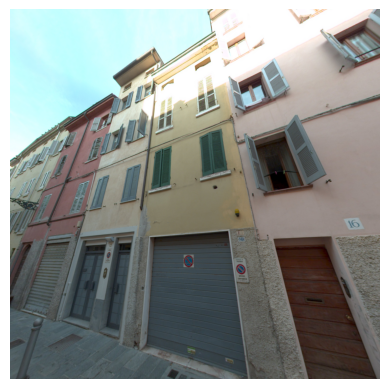

(605186.7396445274, 4962338.653721904, 92.151) (605188.1474014951, 4962337.8965800125, 92.151)
Distance: 2.629246218470888
61.727051545836574 110
block_0 76 182137529 POINT (605186.7396445274 4962338.653721904) S pano_000117_000043.jpg


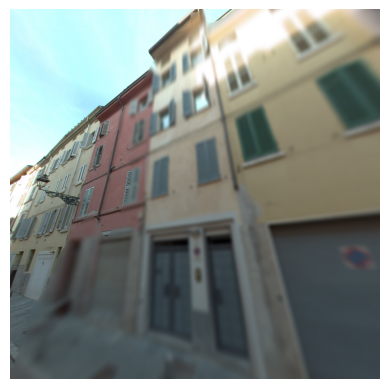

(605182.7413835118, 4962340.810570208, 92.199) (605182.8513170326, 4962340.75114581, 92.199)
Distance: 3.1466801373570386
61.6066281791381 110
block_0 124 182138139 POINT (605182.7413835118 4962340.810570208) S pano_000117_000045.jpg


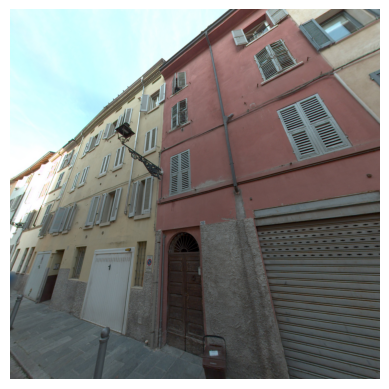

(605177.147803768, 4962343.780226035, 92.243) (605177.459495964, 4962343.6169642275, 92.243)
Distance: 3.606713899818016
62.35482290224339 100
block_0 12 182136647 POINT (605177.147803768 4962343.780226035) S pano_000117_000047.jpg


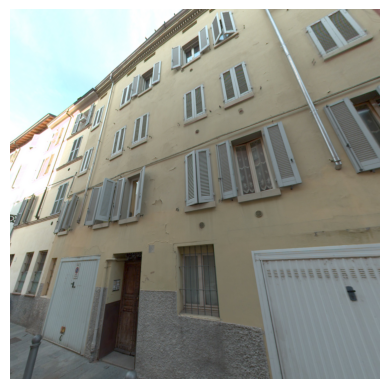

(605172.1463701997, 4962346.092892471, 92.293) (605171.4616889074, 4962346.333557998, 92.293)
Distance: 3.7052128338392833
70.63342114582329 100
block_0 12 182136647 POINT (605172.1463701997 4962346.092892471) S pano_000117_000049.jpg


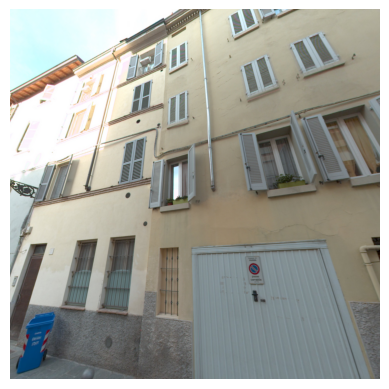

(605167.5844215297, 4962347.651625912, 92.304) (605168.585471345, 4962347.3158868775, 92.304)
Distance: 3.514286893533713
71.45921979070805 100
block_0 117 182137984 POINT (605167.5844215297 4962347.651625912) S pano_000117_000050.jpg


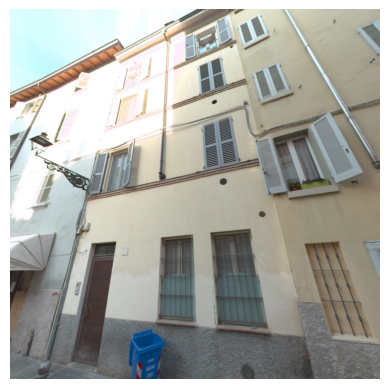

(605155.8669034896, 4962351.6822555065, 92.434) (605157.1629857372, 4962351.232959689, 92.434)
Distance: 2.9126226869257974
70.88077466611819 110
block_0 168 2427045 POINT (605155.8669034896 4962351.6822555065) S pano_000117_000054.jpg


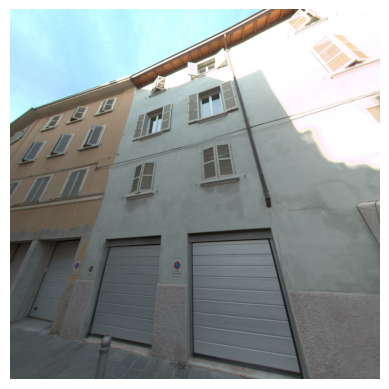

(605143.4584482685, 4962356.123825394, 92.64) (605142.9413300687, 4962356.323960833, 92.64)
Distance: 2.8629463637029664
68.84253177751248 110
block_0 64 182137239 POINT (605143.4584482685 4962356.123825394) S pano_000117_000059.jpg


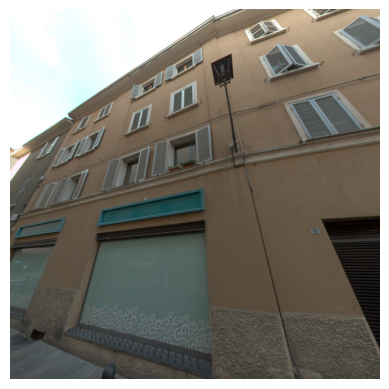

(605131.5536334473, 4962360.968118127, 92.861) (605131.7411664114, 4962360.890271837, 92.861)
Distance: 2.913932890590916
67.45630873553772 110
block_0 181 2427080 POINT (605131.5536334473 4962360.968118127) S pano_000117_000063.jpg


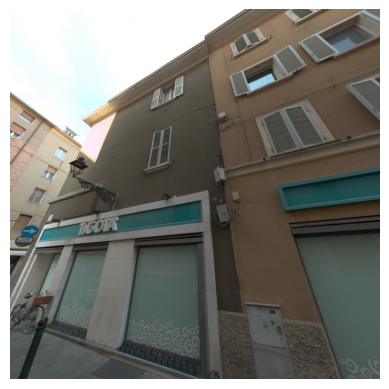

(605134.2705959831, 4962390.963198035, 93.487) (605135.2906638475, 4962390.5868779905, 93.487)
Distance: 7.417586808679617
110.24985868300715 110.24985868300715
block_0 6 182136604 POINT (605134.2705959831 4962390.963198035) N pano_000116_000069.jpg


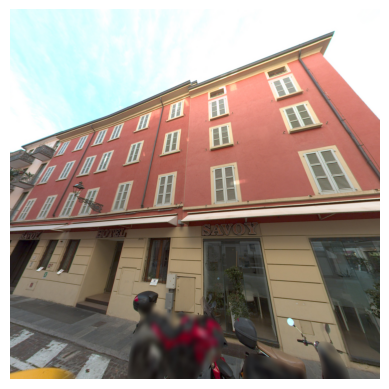

(605144.7712585563, 4962387.090417201, 93.334) (605143.7925635884, 4962387.451316948, 93.334)
Distance: 7.117235700750396
110.24176053857154 110.24176053857154
block_0 4 182136595 POINT (605144.7712585563 4962387.090417201) N pano_000116_000066.jpg


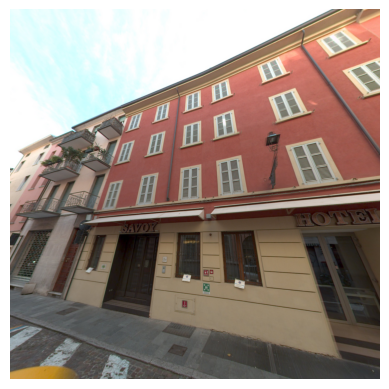

(605155.2402986144, 4962383.2171309255, 93.148) (605155.1262115459, 4962383.259595991, 93.148)
Distance: 7.134568420407998
110.41608602187318 110.41608602187318
block_0 136 182138240 POINT (605155.2402986144 4962383.2171309255) N pano_000116_000062.jpg


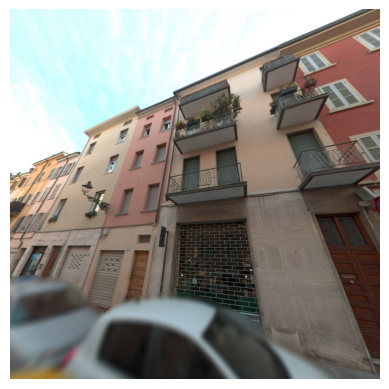

(605160.9584120393, 4962381.093957091, 93.087) (605160.7987669386, 4962381.152970434, 93.087)
Distance: 7.15912725392695
110.28700094525799 110.28700094525799
block_0 122 182138083 POINT (605160.9584120393 4962381.093957091) N pano_000116_000060.jpg


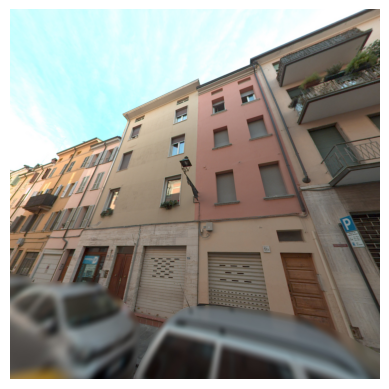

(605166.5213258333, 4962379.02936293, 93.007) (605166.4287299495, 4962379.0638073515, 93.007)
Distance: 7.099664895643188
110.40452321132534 110.40452321132534
block_0 5 182136600 POINT (605166.5213258333 4962379.02936293) N pano_000116_000058.jpg


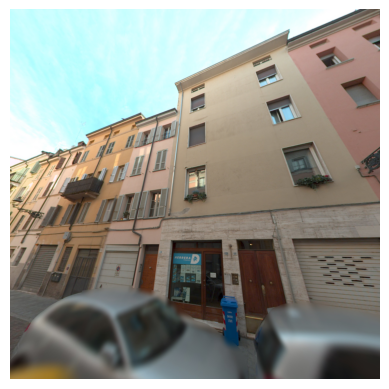

(605171.8656830523, 4962377.027864454, 92.939) (605172.040968636, 4962376.961356711, 92.939)
Distance: 7.01915544345135
110.77800075286048 110.77800075286048
block_0 112 182137955 POINT (605171.8656830523 4962377.027864454) N pano_000116_000056.jpg


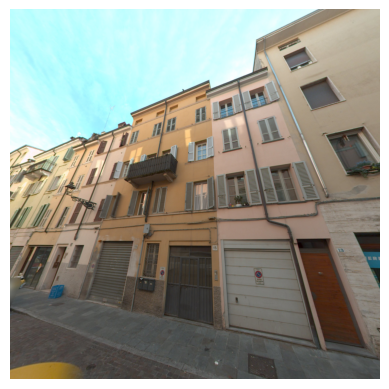

(605176.8317812656, 4962375.18129717, 92.878) (605177.8457069076, 4962374.808701189, 92.878)
Distance: 6.932764272761722
110.1773001075529 110.1773001075529
block_0 109 182137941 POINT (605176.8317812656 4962375.18129717) N pano_000116_000054.jpg


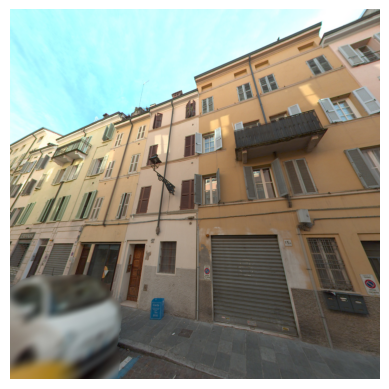

(605181.8018356322, 4962373.334797351, 92.866) (605180.6323886054, 4962373.777504081, 92.866)
Distance: 6.9218238654253526
110.73469820750677 110.73469820750677
block_0 108 182137940 POINT (605181.8018356322 4962373.334797351) N pano_000116_000053.jpg


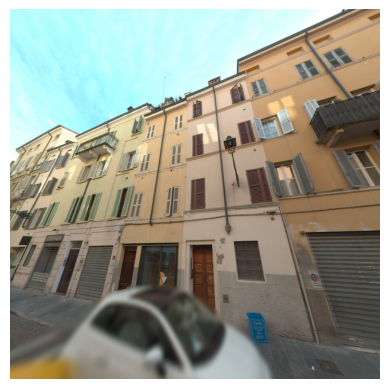

(605185.6142868828, 4962371.897146926, 92.782) (605186.3623309243, 4962371.616061472, 92.782)
Distance: 6.941538229065238
110.59424048023823 110.59424048023823
block_0 94 182137728 POINT (605185.6142868828 4962371.897146926) N pano_000116_000051.jpg


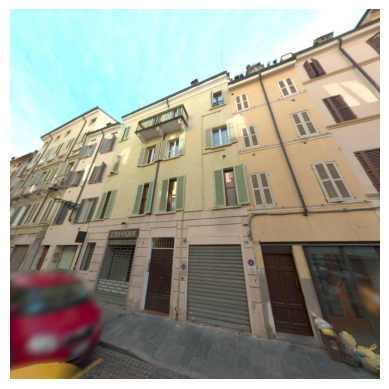

(605191.8021734767, 4962369.587239882, 92.714) (605192.0805373971, 4962369.483655241, 92.714)
Distance: 6.914479016710211
110.41121496107657 110.41121496107657
block_0 169 2427048 POINT (605191.8021734767 4962369.587239882) N pano_000116_000049.jpg


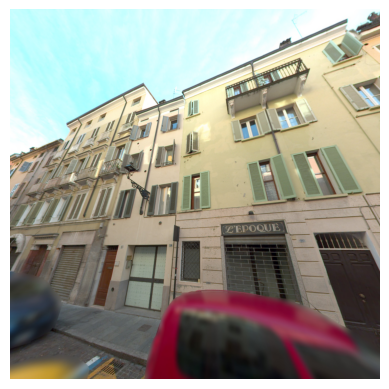

(605197.6473844483, 4962367.4328432735, 92.651) (605197.8669053325, 4962367.353903577, 92.651)
Distance: 6.853396585425324
109.77858169714928 109.77858169714928
block_0 101 182137837 POINT (605197.6473844483 4962367.4328432735) N pano_000116_000047.jpg


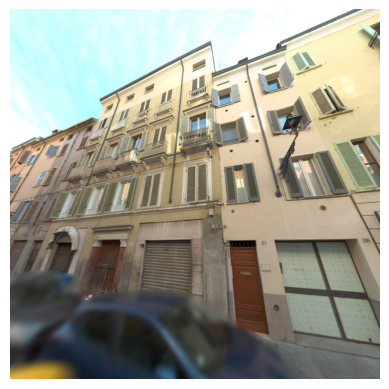

(605204.519729262, 4962364.867477639, 92.596) (605203.4288625593, 4962365.279422153, 92.596)
Distance: 6.875955676866282
110.68806471271385 110.68806471271385
block_0 34 182136815 POINT (605204.519729262 4962364.867477639) N pano_000116_000045.jpg


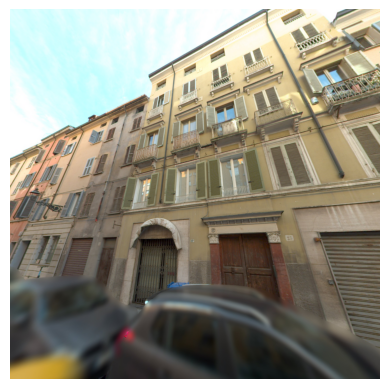

(605211.9250928299, 4962362.116390858, 92.527) (605212.0777623699, 4962362.061906221, 92.527)
Distance: 6.953654367026446
109.64044307911999 109.64044307911999
block_0 16 182136664 POINT (605211.9250928299 4962362.116390858) N pano_000116_000042.jpg


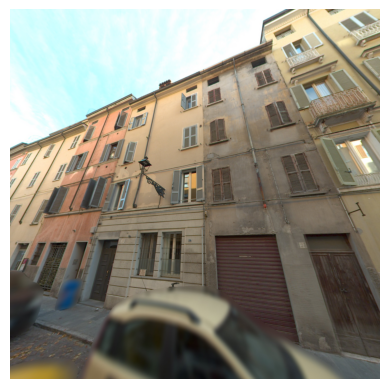

(605216.8619003221, 4962360.36937627, 92.479) (605217.8340534465, 4962360.027680009, 92.479)
Distance: 6.881678497068739
109.36575860669585 109.36575860669585
block_0 15 182136662 POINT (605216.8619003221 4962360.36937627) N pano_000116_000040.jpg


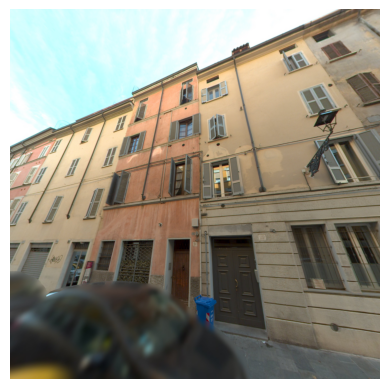

(605222.4870236414, 4962358.372515196, 92.409) (605223.5248987231, 4962358.000603097, 92.409)
Distance: 6.809542036004176
109.71463025240283 109.71463025240283
block_0 166 2427037 POINT (605222.4870236414 4962358.372515196) N pano_000116_000038.jpg


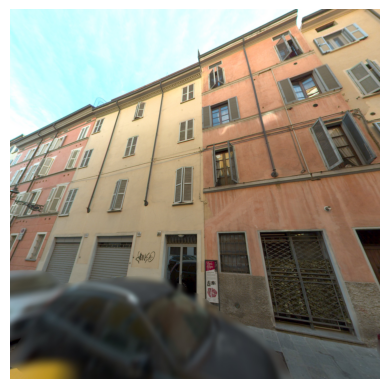

(605230.081742066, 4962355.65232951, 92.365) (605229.2620390552, 4962355.945835077, 92.365)
Distance: 6.810821951640616
109.70058222476784 109.70058222476784
block_0 14 182136652 POINT (605230.081742066 4962355.65232951) N pano_000116_000036.jpg


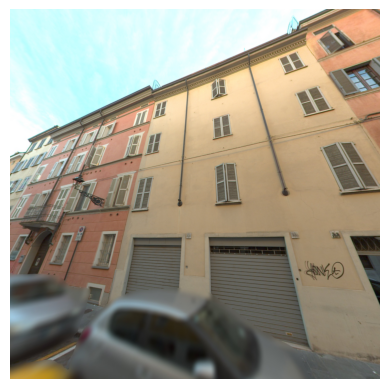

(605241.4552208579, 4962351.621764114, 92.268) (605240.7668524412, 4962351.8639138285, 92.268)
Distance: 6.675340662620491
109.38051697556703 109.38051697556703
block_0 28 182136749 POINT (605241.4552208579 4962351.621764114) N pano_000116_000032.jpg


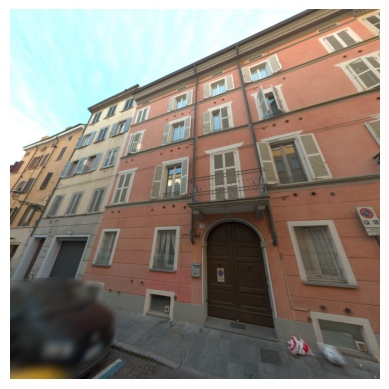

(605251.1425772081, 4962348.152508633, 92.194) (605252.1015253359, 4962347.7957263375, 92.194)
Distance: 6.6603204907547005
110.40801382542206 110.40801382542206
block_0 103 182137892 POINT (605251.1425772081 4962348.152508633) N pano_000116_000028.jpg


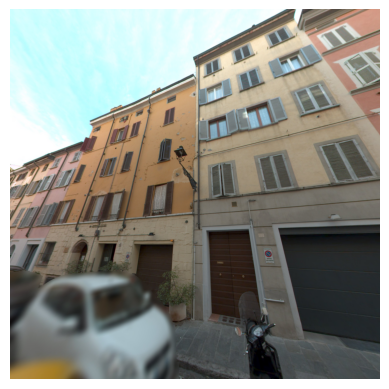

(605259.0523239998, 4962345.276399767, 92.134) (605257.8716313266, 4962345.699523205, 92.134)
Distance: 6.6705313123691985
109.71609623651888 109.71609623651888
block_0 10 182136612 POINT (605259.0523239998 4962345.276399767) N pano_000116_000026.jpg


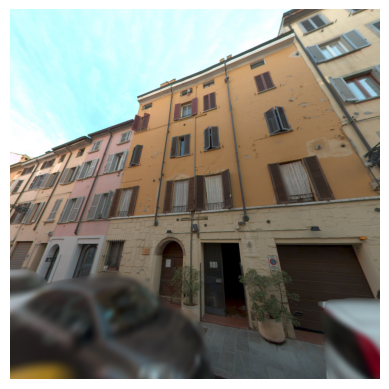

(605266.2732138163, 4962342.683468508, 92.122) (605266.4131850052, 4962342.632997224, 92.122)
Distance: 6.585437633232303
109.82846078989986 109.82846078989986
block_0 72 182137474 POINT (605266.2732138163 4962342.683468508) N pano_000116_000023.jpg


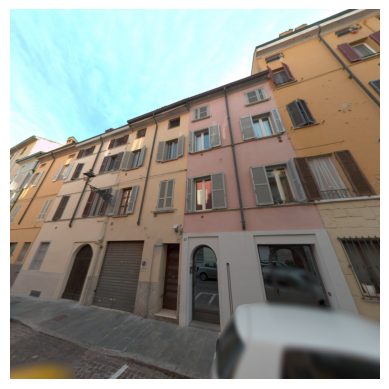

(605270.9604041779, 4962340.96574079, 92.088) (605272.0045524061, 4962340.576940652, 92.088)
Distance: 6.601000005906268
110.42337115426878 110.42337115426878
block_0 133 182138214 POINT (605270.9604041779 4962340.96574079) N pano_000116_000021.jpg


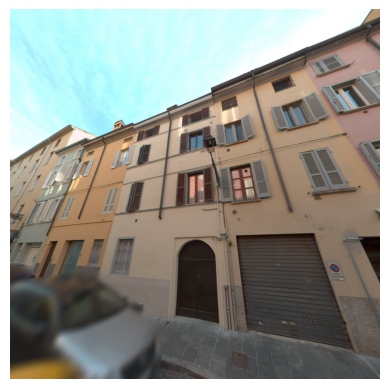

(605276.582700306, 4962338.902211865, 92.073) (605277.8211063892, 4962338.452408017, 92.073)
Distance: 6.730979213411159
109.96162483615889 109.96162483615889
block_0 121 182138080 POINT (605276.582700306 4962338.902211865) N pano_000116_000019.jpg


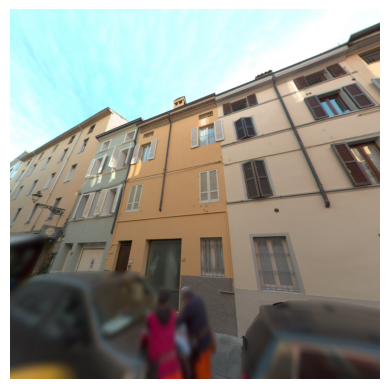

(605281.7668752945, 4962337.025960088, 92.065) (605280.709101708, 4962337.406435866, 92.065)
Distance: 6.774396687698806
109.78340017248173 109.78340017248173
block_0 84 182137642 POINT (605281.7668752945 4962337.025960088) N pano_000116_000018.jpg


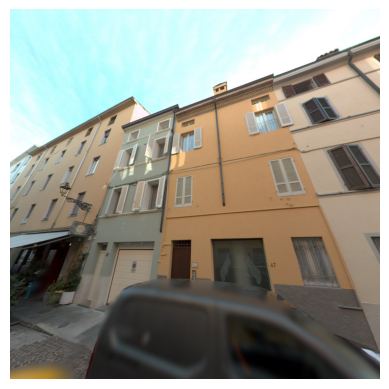

(605286.2355125251, 4962335.371332195, 92.026) (605286.2569808067, 4962335.36321411, 92.026)
Distance: 6.793953558517213
110.71377174744194 110.71377174744194
block_0 116 182137975 POINT (605286.2355125251 4962335.371332195) N pano_000116_000016.jpg


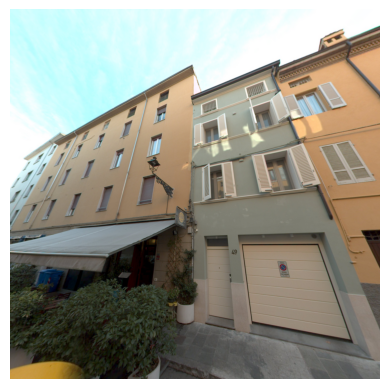

(605291.3613844321, 4962333.433021115, 92.01) (605291.9283606864, 4962333.21862347, 92.01)
Distance: 6.804204685474302
110.71372043199857 110.71372043199857
block_0 47 182136877 POINT (605291.3613844321 4962333.433021115) N pano_000116_000014.jpg


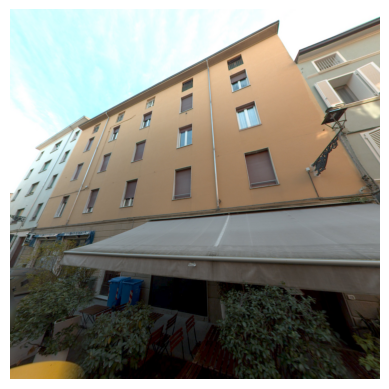

(605300.4250273625, 4962329.653620832, 91.951) (605300.0325233223, 4962329.8232997535, 91.951)
Distance: 6.9415924544396965
113.37875754764681 113.37875754764681
block_0 47 182136877 POINT (605300.4250273625 4962329.653620832) N pano_000116_000011.jpg


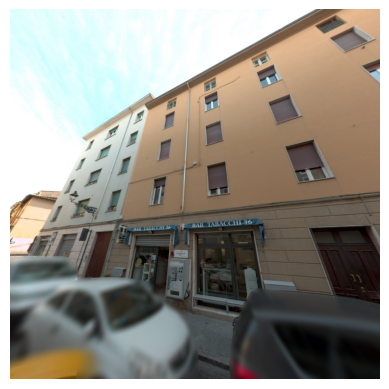

(605313.1119913978, 4962324.155770952, 91.894) (605313.8576749393, 4962323.831810618, 91.894)
Distance: 6.990091915365723
113.48241485788644 113.48241485788644
block_0 8 182136607 POINT (605313.1119913978 4962324.155770952) N pano_000116_000006.jpg


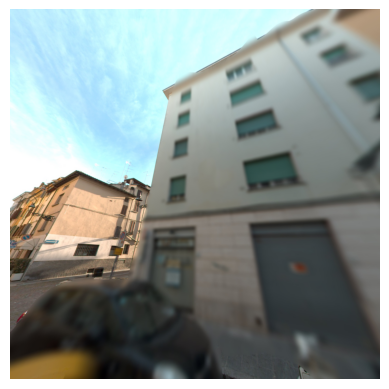

(605321.1744215561, 4962320.654442409, 91.848) (605322.2902491918, 4962320.17049102, 91.848)
Distance: 6.651759593520992
113.44710990121379 113.44710990121379
block_0 62 182137189 POINT (605321.1744215561 4962320.654442409) N pano_000116_000003.jpg


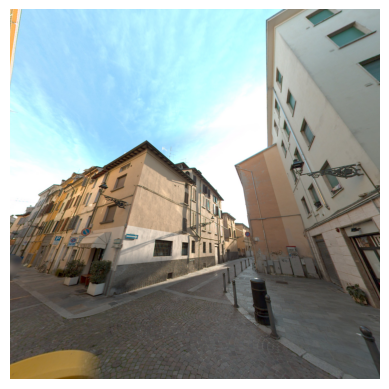

(605301.1746041913, 4962287.998296874, 91.586) (605301.9955965766, 4962287.621935962, 91.586)
Distance: 4.150487933556002
65.37224048328417 100
block_0 74 182137491 POINT (605301.1746041913 4962287.998296874) S pano_000117_000002.jpg


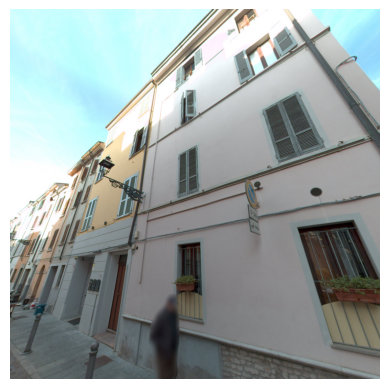

(605292.611158983, 4962291.902564376, 91.623) (605293.5859376558, 4962291.459412586, 91.623)
Distance: 4.484484039591135
65.55260735447222 100
block_0 163 2427027 POINT (605292.611158983 4962291.902564376) S pano_000117_000005.jpg


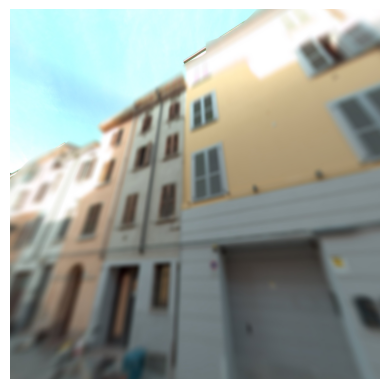

(605284.8607103209, 4962295.431256929, 91.662) (605285.2726556855, 4962295.242970625, 91.662)
Distance: 4.3364123205574545
65.43646148062581 100
block_0 69 182137376 POINT (605284.8607103209 4962295.431256929) S pano_000117_000008.jpg


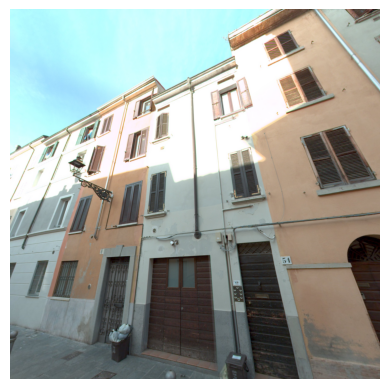

(605280.580699835, 4962297.40009407, 91.699) (605279.8050652883, 4962297.759139276, 91.699)
Distance: 4.218396105656076
65.16033993861527 100
block_0 137 182138243 POINT (605280.580699835 4962297.40009407) S pano_000117_000010.jpg


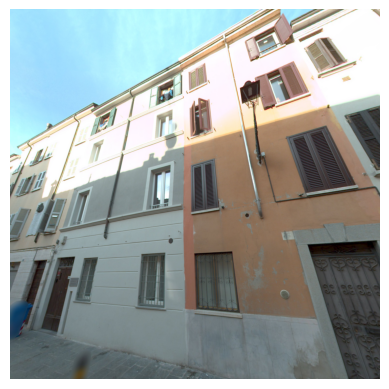

(605275.3922614644, 4962299.776288828, 91.74) (605274.252054797, 4962300.29448556, 91.74)
Distance: 4.070216676644365
65.55933640323265 100
block_0 1 182136570 POINT (605275.3922614644 4962299.776288828) S pano_000117_000012.jpg


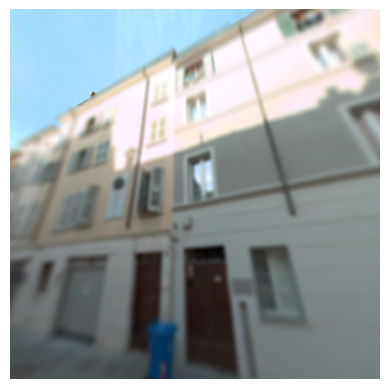

(605268.1758577912, 4962303.058188269, 91.749) (605268.734932624, 4962302.803805973, 91.749)
Distance: 3.954924313773454
65.5341892123413 100
block_0 11 182136621 POINT (605268.1758577912 4962303.058188269) S pano_000117_000014.jpg


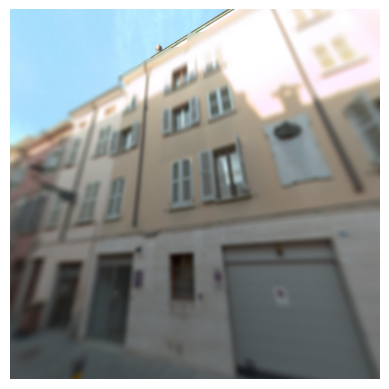

(605262.3020605787, 4962305.74539811, 91.781) (605263.2245578098, 4962305.317687083, 91.781)
Distance: 3.9501376511702384
65.12544917412956 100
block_0 2 182136574 POINT (605262.3020605787 4962305.74539811) S pano_000117_000016.jpg


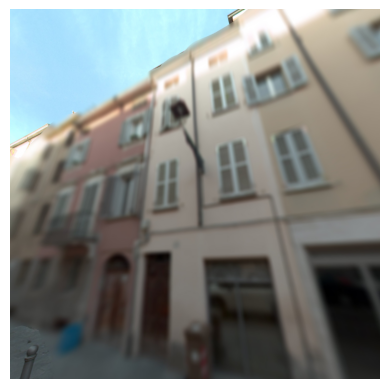

(605258.0819204188, 4962307.681896344, 91.78) (605257.6791367308, 4962307.865437772, 91.78)
Distance: 3.9819032880024645
65.50208182833138 100
block_0 120 182138057 POINT (605258.0819204188 4962307.681896344) S pano_000117_000018.jpg


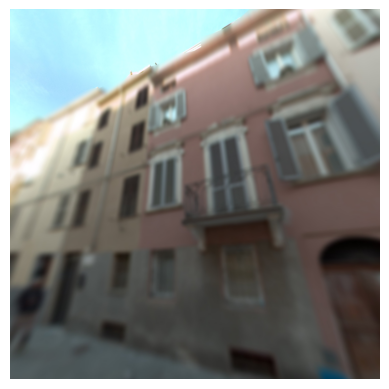

(605253.3321693218, 4962309.837508211, 91.827) (605252.1911656825, 4962310.352936812, 91.827)
Distance: 4.144424328359085
65.68975218234453 100
block_0 71 182137460 POINT (605253.3321693218 4962309.837508211) S pano_000117_000020.jpg


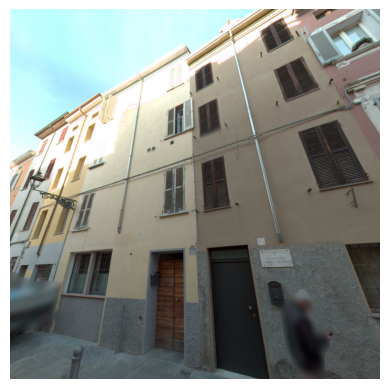

(605248.5502439637, 4962312.025931019, 91.855) (605249.4635445328, 4962311.60328739, 91.855)
Distance: 4.3086887671511045
65.16694736841723 100
block_0 167 2427043 POINT (605248.5502439637 4962312.025931019) S pano_000117_000021.jpg


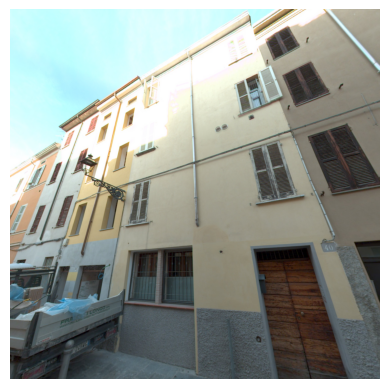

(605244.426553959, 4962313.869569985, 91.865) (605243.7280261862, 4962314.163892302, 91.865)
Distance: 4.537946617744684
67.15203958811531 100
block_0 111 182137952 POINT (605244.426553959 4962313.869569985) S pano_000117_000023.jpg


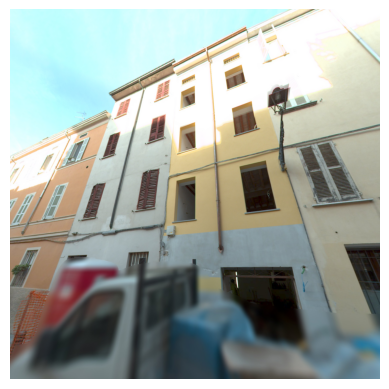

(605240.2085629932, 4962315.433884441, 91.847) (605240.5733097399, 4962315.309430889, 91.847)
Distance: 4.2279451087649615
71.16008286000027 100
block_0 26 182136738 POINT (605240.2085629932 4962315.433884441) S pano_000117_000024.jpg


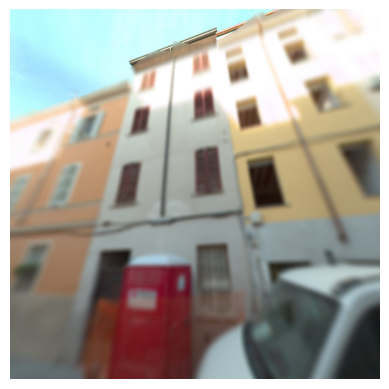

(605236.5502719583, 4962316.874027181, 91.875) (605235.5488124934, 4962317.407644702, 91.875)
Distance: 3.6389928689243143
61.65333697690963 100
block_0 183 2427083 POINT (605236.5502719583 4962316.874027181) S pano_000117_000026.jpg


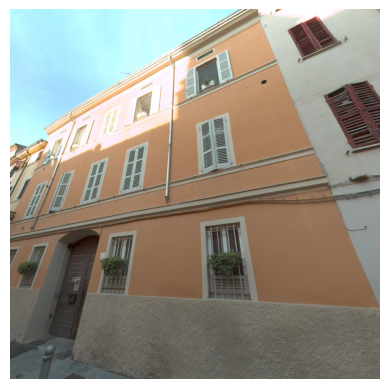

(605229.8011200549, 4962320.1247298075, 91.902) (605229.8844478476, 4962320.085338572, 91.902)
Distance: 3.3751033871974108
64.69866916320251 110
block_0 183 2427083 POINT (605229.8011200549 4962320.1247298075) S pano_000117_000028.jpg


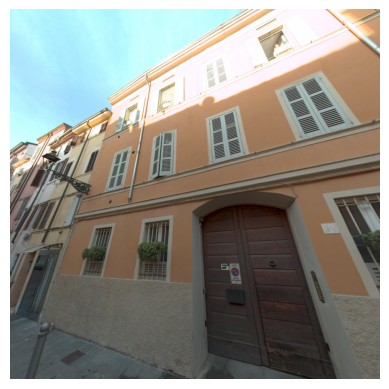

(605222.4590953263, 4962323.593512869, 91.965) (605221.6793502118, 4962323.961148157, 91.965)
Distance: 3.478300744986239
64.756996186229 110
block_0 104 182137901 POINT (605222.4590953263 4962323.593512869) S pano_000117_000031.jpg


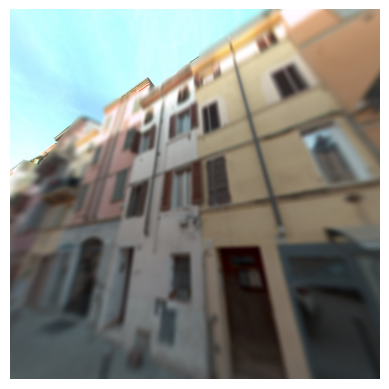

(605219.2067128094, 4962325.123645015, 91.976) (605218.9092101221, 4962325.263318867, 91.976)
Distance: 3.6006530656483755
64.85052196336972 100
block_0 102 182137853 POINT (605219.2067128094 4962325.123645015) S pano_000117_000032.jpg


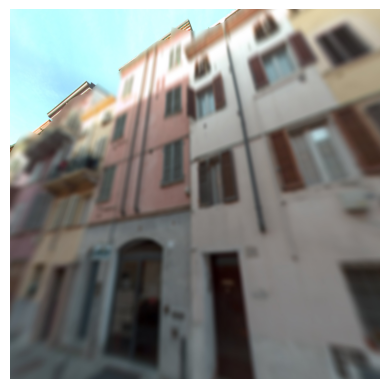

(605215.8005800567, 4962326.623483861, 91.978) (605215.9801249673, 4962326.5493886545, 91.978)
Distance: 3.699120496111203
67.57487261576178 100
block_0 87 182137654 POINT (605215.8005800567 4962326.623483861) S pano_000117_000033.jpg


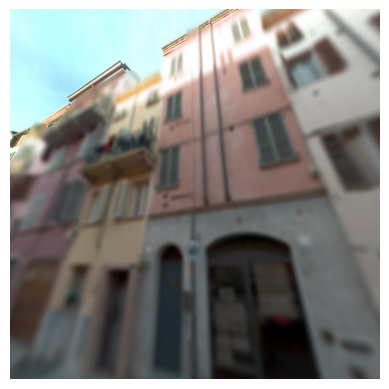

(605212.4879364334, 4962327.969295556, 91.971) (605213.1433904796, 4962327.70770774, 91.971)
Distance: 3.675528309960386
68.24335153531078 100
block_0 78 182137556 POINT (605212.4879364334 4962327.969295556) S pano_000117_000034.jpg


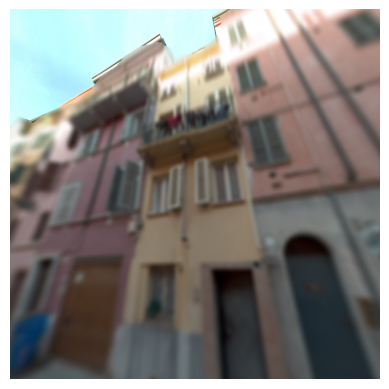

(605208.5829658262, 4962329.49986359, 92.012) (605207.4189065866, 4962329.950564664, 92.012)
Distance: 3.439593441669315
68.83456681886797 110
block_0 60 182137110 POINT (605208.5829658262 4962329.49986359) S pano_000117_000036.jpg


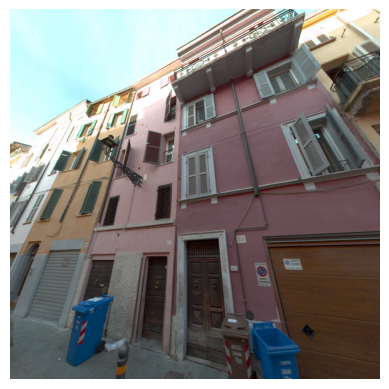

(605204.6459102365, 4962331.057686775, 92.03) (605204.6530879929, 4962331.054757214, 92.03)
Distance: 3.313436081887033
67.7974469708887 110
block_0 96 182137766 POINT (605204.6459102365 4962331.057686775) S pano_000117_000037.jpg


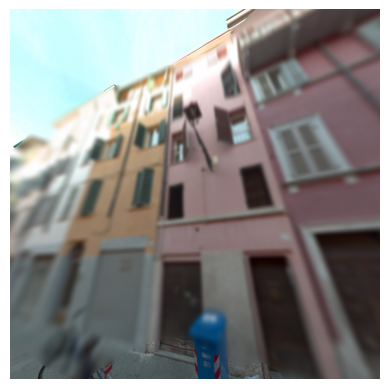

(605201.0826239454, 4962332.493848888, 92.071) (605201.7869420095, 4962332.212893854, 92.071)
Distance: 3.157630545562626
68.25276380447728 110
block_0 91 182137721 POINT (605201.0826239454 4962332.493848888) S pano_000117_000038.jpg


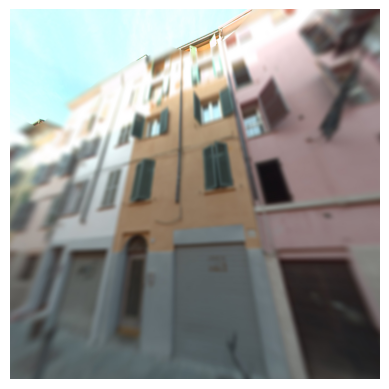

(605197.3961287781, 4962333.966886216, 92.106) (605196.175009031, 4962334.455756873, 92.106)
Distance: 2.819747146860025
68.1814924535908 110
block_0 115 182137972 POINT (605197.3961287781 4962333.966886216) S pano_000117_000040.jpg


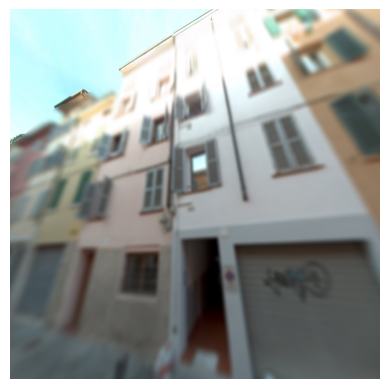

(605193.6137396365, 4962335.499468997, 92.123) (605193.402840701, 4962335.585774607, 92.123)
Distance: 2.708554609906391
67.74428046894431 110
block_0 97 182137768 POINT (605193.6137396365 4962335.499468997) S pano_000117_000041.jpg


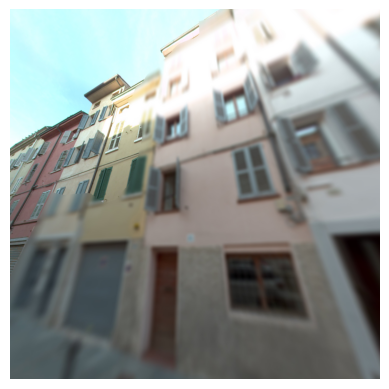

(605189.0102119548, 4962278.689577905, 91.993) (605188.1073153985, 4962279.095386436, 91.993)
Distance: 50.88606573567179
114.20162226212102 114.20162226212102


In [10]:
# Ensure all previous figures are closed
plt.close('all')

# Set %matplotlib inline to make sure interactive plotting is turned off
%matplotlib inline

images_folder = 'data/PANO/'

for i, row in gdf_combined.iterrows():
    # Camera and target coordinates (2D only, ignoring z)
    camera_coords = (row.loc['X'], row.loc['Y'], row.loc['Z'])  # Camera position (x, y, z)
    midpoint_coords = (row.loc['geometry_midpoint'].x, row.loc['geometry_midpoint'].y, row.loc['Z'])  # Midpoint of facade (x, y, z)
    
    # Facade segment extremes (ensure only x, y are considered)
    facade_start = (row.loc['geometry_outer_edge'].coords[0][:2])  # One end of the facade segment (x, y)
    facade_end = (row.loc['geometry_outer_edge'].coords[-1][:2])  # The other end of the facade segment (x, y)

    # Project the camera position onto the facade segment
    projected_target = project_point_onto_segment(camera_coords[:2], facade_start, facade_end)
    projected_target = (projected_target[0], projected_target[1], row.loc['Z'])  # Reintroduce z-coordinate

    print(midpoint_coords, projected_target)

    # Calculate yaw and pitch using the projected target
    yaw, pitch = calculate_yaw_pitch(camera_coords, projected_target)

    # Adjust pitch (fixed value for now)
    pitch_adjustment = 25  # degrees
    pitch += pitch_adjustment

    # Calculate dynamic FoV based on vectors
    v1, v2 = calculate_vectors(camera_coords, projected_target)
    calculated_fov = calculate_dynamic_fov(v1, v2)

    # Adjust FoV based on the distance between camera and midpoint
    fov, distance = adjust_fov_based_on_distance(camera_coords, projected_target, calculated_fov)

    print(calculated_fov, fov)

    if distance > 20:
        break  # Skip further processing if the camera is too far from the target

    # Path to the image
    path = row.loc['PATH']
    run = row.loc['RUN']
    image_name = row.loc['FOTO']
    image_path = '{}{}/{}/{}'.format(images_folder, path, run, image_name)
    image = cv2.imread(image_path)

    # Convert the original image to RGB before any further processing
    rgb_image = convert_bgr_to_rgb(image)

    # Parameters for perspective projection
    roll = row.loc['Roll']

    output_image_shape = 'squared'  # 'squared', 'horizontal' or 'vertical'
    if output_image_shape == 'squared':
        output_width = 1024
        output_height = 1024
    elif output_image_shape == 'horizontal':
        output_width = 1024
        output_height = 512
    elif output_image_shape == 'vertical':
        output_width = 512
        output_height = 1024

    # Apply the transformation
    output_image = enhanced_equirectangular_to_perspective(rgb_image, fov, yaw, pitch, roll, output_height, output_width)

    print(row.loc['group_id'], row.loc['building_id'], row.loc['osm_id'], row.loc['geometry_midpoint'], row.loc['orientation_midpoint'], image_name)

    # Display the transformed image
    plt.imshow(output_image)
    plt.axis('off')  # Hide the axes
    plt.show()

    # Close the figure to prevent old plots from showing up again
    plt.close('all')  # Close all figures
